# Objetivo do notebook é aplicar os conceitos apresentados no paper "Mean–variance portfolio optimization using machine learning-based", de Wei Chen et. all.

## [Link](https://sci-hub.se/10.1016/j.asoc.2020.106943 "Artigo")

In [190]:
import pandas as pd
import numpy as np
import pandas_datareader.data as web
import datetime as dt
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import style
import matplotlib.ticker as mtick
import seaborn as sns
import yfinance as yf

style.use('ggplot')

import plotly.graph_objects as go

from sklearn.model_selection import train_test_split, GridSearchCV, KFold, RandomizedSearchCV

import xgboost as xgb
import warnings
warnings.filterwarnings(action='ignore', category=UserWarning)

from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error



In [71]:
#from stldecompose import decompose

# Chart drawing
import plotly as py
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# Mute sklearn warnings
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)
simplefilter(action='ignore', category=DeprecationWarning)

# Show charts when running kernel
init_notebook_mode(connected=True)

# Change default background color for all visualizations
layout=go.Layout(paper_bgcolor='rgba(0,0,0,0)', plot_bgcolor='rgba(250,250,250,0.8)')
fig = go.Figure(layout=layout)
templated_fig = pio.to_templated(fig)
pio.templates['my_template'] = templated_fig.layout.template
pio.templates.default = 'my_template'

In [72]:
#!pip install yfinance
#yf.pdr_override()
#!pip install stldecompose

In [73]:

#Lista dos 24 ativos abordados pelo autor, todos parte do índice SSE 50, da Bolsa de Shanghai:

ativos = ['600000.SS', '600018.SS', '600028.SS', '600029.SS', '600031.SS', '600048.SS', '600050.SS', '600089.SS', '600100.SS', '600156.SS', '600547.SS', '600637.SS', '600690.SS', '600837.SS',	'600887.SS', '600999.SS', '601006.SS', '601088.SS', '601111.SS', '601166.SS', '601186.SS', '601688.SS', '601766.SS', '601988.SS']

#O autor avalia os ativos entre novembro/2009 e novembro/2019:
inicio = dt.datetime(2009,11,1)
fim = dt.datetime(2019,11,30)

In [74]:
#Um teste para avaliar o primeiro dos ativos:
teste = yf.download("600000.SS", start=inicio, end=fim)
teste

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2009-11-02,8.772292,9.632970,8.722638,9.504696,6.291415,265173584
2009-11-03,9.517110,9.661935,9.475731,9.587453,6.346194,207655706
2009-11-04,9.562626,9.968138,9.521247,9.794347,6.483143,235029795
2009-11-05,9.757106,9.889518,9.670211,9.744693,6.450275,126982654
2009-11-06,9.848140,9.992965,9.724003,9.777796,6.472187,154066548
...,...,...,...,...,...,...
2019-11-25,12.030000,12.140000,12.000000,12.070000,10.896770,25153256
2019-11-26,12.150000,12.170000,11.980000,12.060000,10.887743,59633264
2019-11-27,12.070000,12.070000,11.900000,11.990000,10.824547,28703956


In [75]:
# Baixando os dados e organizando num DF:

df_ativos = pd.DataFrame(columns = teste.columns)

for ativo in ativos:
    
    dados = yf.download(ativo, inicio, fim)
    dados['Ativo'] = ativo 
    df_ativos = pd.concat([df_ativos, dados])
    
    
    print(f"Iniciando o download de {ativo}...")
    

[*********************100%***********************]  1 of 1 completed
Iniciando o download de 600000.SS...
[*********************100%***********************]  1 of 1 completed
Iniciando o download de 600018.SS...
[*********************100%***********************]  1 of 1 completed
Iniciando o download de 600028.SS...
[*********************100%***********************]  1 of 1 completed
Iniciando o download de 600029.SS...
[*********************100%***********************]  1 of 1 completed
Iniciando o download de 600031.SS...
[*********************100%***********************]  1 of 1 completed
Iniciando o download de 600048.SS...
[*********************100%***********************]  1 of 1 completed
Iniciando o download de 600050.SS...
[*********************100%***********************]  1 of 1 completed
Iniciando o download de 600089.SS...
[*********************100%***********************]  1 of 1 completed
Iniciando o download de 600100.SS...
[*********************100%********************

In [76]:
df_ativos.shape

(57539, 7)

In [77]:
df_ativos

,Open,High,Low,Close,Adj Close,Volume,Ativo
2009-11-02,8.772292,9.632970,8.722638,9.504696,6.291415,265173584,600000.SS
2009-11-03,9.517110,9.661935,9.475731,9.587453,6.346194,207655706,600000.SS
2009-11-04,9.562626,9.968138,9.521247,9.794347,6.483143,235029795,600000.SS
2009-11-05,9.757106,9.889518,9.670211,9.744693,6.450275,126982654,600000.SS
2009-11-06,9.848140,9.992965,9.724003,9.777796,6.472187,154066548,600000.SS
...,...,...,...,...,...,...,...
2019-11-25,3.610000,3.660000,3.610000,3.650000,3.256570,85133202,601988.SS
2019-11-26,3.660000,3.680000,3.640000,3.670000,3.274414,149997057,601988.SS
2019-11-27,3.670000,3.670000,3.650000,3.660000,3.265492,47606200,601988.SS
2019-11-28,3.660000,3.660000,3.640000,3.650000,3.256570,52741532,601988.SS


In [78]:
df_ativos.sort_index(inplace=True) #Organizando o df por datas

In [79]:
df_ativos.isna().sum() #Nenhum dado nulo...

Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
Ativo        0
dtype: int64

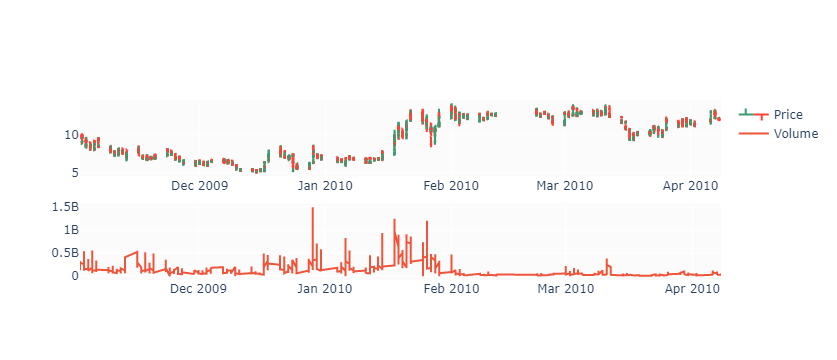

In [80]:
#Exemplo do que estamos lidando: Ativo 1:
fig = make_subplots(rows=2, cols=1)

fig.add_trace(go.Ohlc(x=df_ativos.index,
                      open=df_ativos[df_ativos['Ativo']=='600000.SS'].Open,
                      high=df_ativos[df_ativos['Ativo']=='600000.SS'].High,
                      low=df_ativos[df_ativos['Ativo']=='600000.SS'].Low,
                      close=df_ativos[df_ativos['Ativo']=='600000.SS'].Close,
                      name='Price'), row=1, col=1)

fig.add_trace(go.Scatter(x=df_ativos.index, y=df_ativos[df_ativos['Ativo']=='600000.SS'].Volume, name='Volume'), row=2, col=1)

fig.update(layout_xaxis_rangeslider_visible=False)
fig.show()

## Métricas apresentadas pelo autor no artigo:

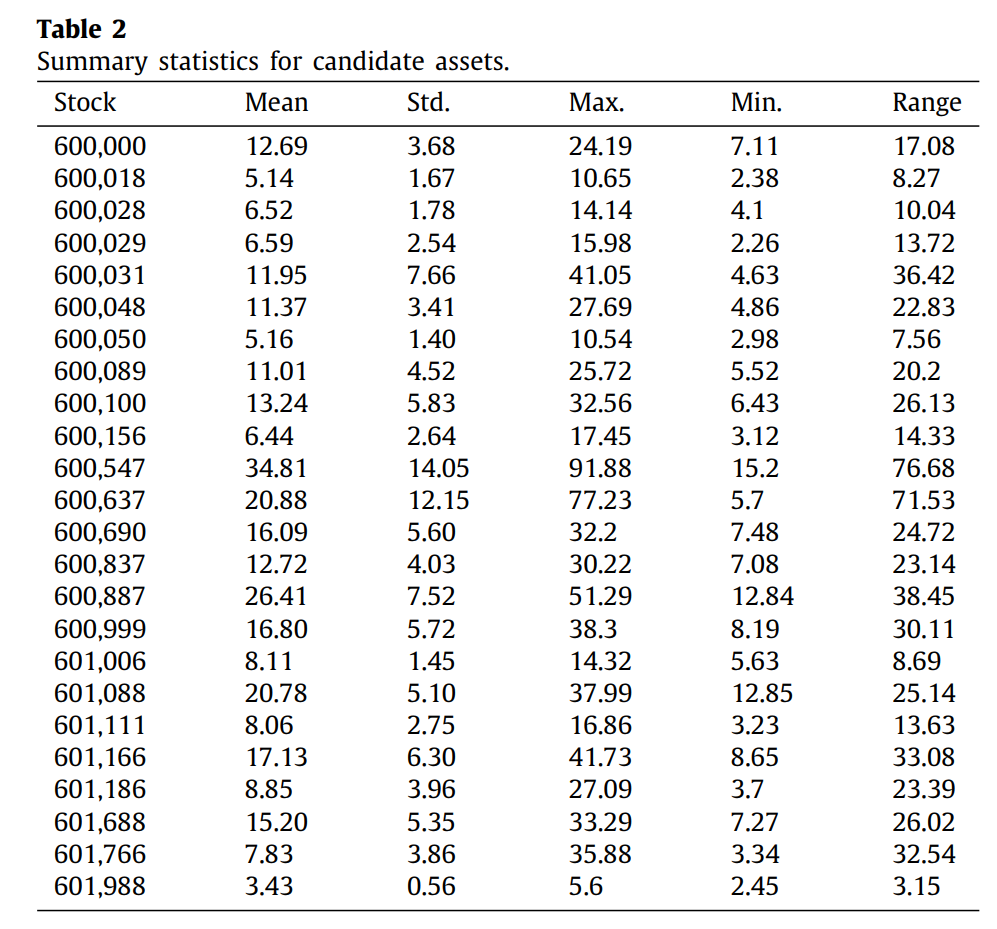

In [81]:
df_ativos.groupby(['Ativo']).mean() #Médias de preço de fechamento ['Close'] próximos aos que foram obtidos pelo autor, com algumas exceções

,Open,High,Low,Close,Adj Close
Ativo,,,,,
600000.SS,9.296733,9.407926,9.195210,9.301931,7.410893
600018.SS,5.156924,5.236524,5.078920,5.160525,4.317566
600028.SS,5.821015,5.889958,5.756874,5.826661,4.069470
600029.SS,6.621151,6.755156,6.496077,6.631513,6.258508
600031.SS,9.414674,9.572310,9.260949,9.419382,8.387380
600048.SS,8.741566,8.912498,8.590429,8.755348,7.251549
600050.SS,5.170475,5.256354,5.093094,5.176923,4.831076
600089.SS,9.676878,9.820226,9.527127,9.669259,8.395360
600100.SS,11.317607,11.548589,11.113394,11.324803,10.850935


In [82]:
df_ativos.groupby(['Ativo']).count() # -> Nem todos os ativos apresentam cotação para todo o período, porém há dados que cobrem grande parte do espectro temporal para cada ativo.

,Open,High,Low,Close,Adj Close,Volume
Ativo,,,,,,
600000.SS,2410,2410,2410,2410,2410,2410
600018.SS,2399,2399,2399,2399,2399,2399
600028.SS,2450,2450,2450,2450,2450,2450
600029.SS,2432,2432,2432,2432,2432,2432
600031.SS,2448,2448,2448,2448,2448,2448
600048.SS,2448,2448,2448,2448,2448,2448
600050.SS,2356,2356,2356,2356,2356,2356
600089.SS,2431,2431,2431,2431,2431,2431
600100.SS,2307,2307,2307,2307,2307,2307


In [83]:
#path = r"C:\Users\Alexandre\OneDrive\Documentos\1. PRO\Data Science\Projeto Integrador\Apoio\Abner"
#df_ativos.to_csv(path_or_buf = path+"df_ativos.csv" )

## O paper traz uma série de dados de entrada, que vamos preparar na sequência. São eles:

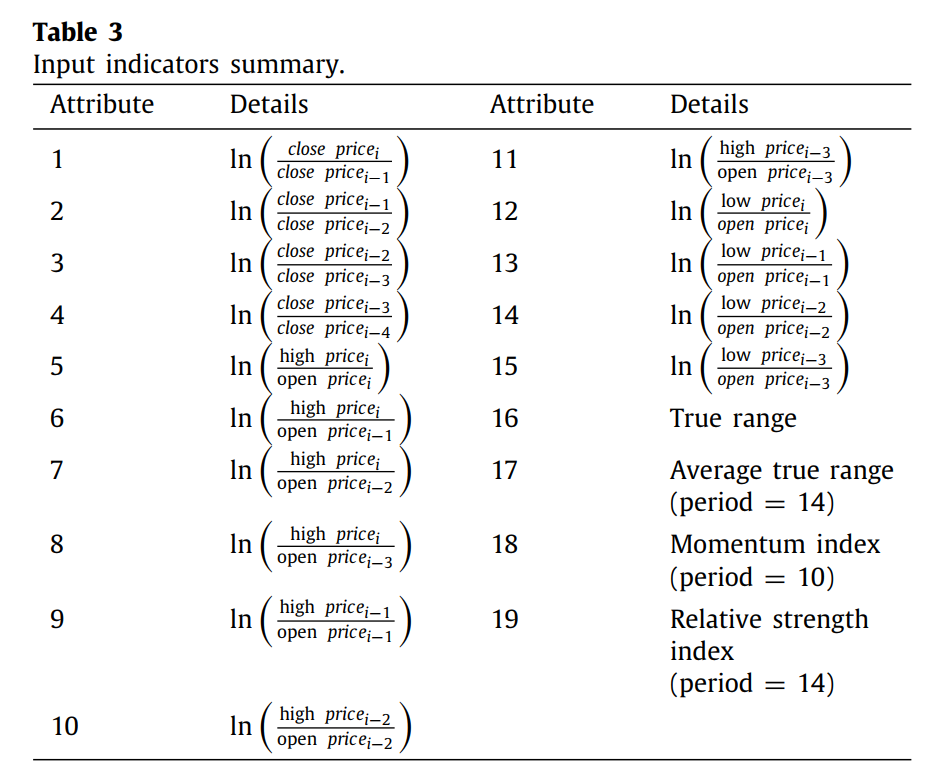

Como se pode observar, são 15 variáveis que envolvem relações temporais entre preços (open, close, high, low), além de 4 outras features muito utilizadas (True Range, Average True Range | 14d, Momentum Index | 10d, Relative Strength Index | 14d).

Na sequência, vamos criar todas essas varíaveis com base nos dados já levantados. Siglas:

* O - Open Price para um dia *"i"* específico
* C - Close Price para um dia *"i"* específico
* H - Highest Price para um dia *"i"* específico
* L - Lowest Price para um dia *"i"* específico



In [84]:
#Criando as features de entrada no DataFrame:

df_ativos['1: ln(C/C-1)'] = pd.Series(dtype=float)
df_ativos['2: ln(C-1/C-2)'] = pd.Series(dtype=float)
df_ativos['3: ln(C-2/C-3)'] = pd.Series(dtype=float)
df_ativos['4: ln(C-3/C-4)'] = pd.Series(dtype=float)
df_ativos['5: ln(H/O)'] = pd.Series(dtype=float)
df_ativos['6: ln(H/O-1)'] = pd.Series(dtype=float)
df_ativos['7: ln(H/O-2)'] = pd.Series(dtype=float)
df_ativos['8: ln(H/O-3)'] = pd.Series(dtype=float)
df_ativos['9: ln(H-1/O-1)'] = pd.Series(dtype=float)
df_ativos['10: ln(H-2/O-2)'] = pd.Series(dtype=float)
df_ativos['11: ln(H-3/O-3)'] = pd.Series(dtype=float)
df_ativos['12: ln(L/O)'] = pd.Series(dtype=float)
df_ativos['13: ln(L-1/O-1)'] = pd.Series(dtype=float)
df_ativos['14: ln(L-2/O-2)'] = pd.Series(dtype=float)
df_ativos['15: ln(L-3/O-3)'] = pd.Series(dtype=float)
df_ativos['16: True Range'] = pd.Series(dtype=float)
df_ativos['17: ATR 14d'] = pd.Series(dtype=float)
df_ativos['18: MI 10d'] = pd.Series(dtype=float)
df_ativos['19: RSI 14d'] = pd.Series(dtype=float)

In [85]:
#Calculando as variáveis com logaritmos naturais "lagged":

for ativo in ativos:
    
    df_ativos.loc[df_ativos['Ativo'] == ativo,'1: ln(C/C-1)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo, 'Close'] / df_ativos.loc[df_ativos['Ativo'] == ativo,'Close'].shift(1))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'2: ln(C-1/C-2)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Close'].shift(1)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Close'].shift(2))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'3: ln(C-2/C-3)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Close'].shift(2)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Close'].shift(3))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'4: ln(C-3/C-4)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Close'].shift(3)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Close'].shift(4))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'5: ln(H/O)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High']/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'])
    df_ativos.loc[df_ativos['Ativo'] == ativo,'6: ln(H/O-1)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High']/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(1))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'7: ln(H/O-2)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High']/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(2))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'8: ln(H/O-3)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High']/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(3))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'9: ln(H-1/O-1)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High'].shift(1)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(1))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'10: ln(H-2/O-2)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High'].shift(2)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(2))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'11: ln(H-3/O-3)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['High'].shift(3)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(3))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'12: ln(L/O)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Low']/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'])
    df_ativos.loc[df_ativos['Ativo'] == ativo,'13: ln(L-1/O-1)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Low'].shift(1)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(1))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'14: ln(L-2/O-2)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Low'].shift(2)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(2))
    df_ativos.loc[df_ativos['Ativo'] == ativo,'15: ln(L-3/O-3)'] = np.log(df_ativos.loc[df_ativos['Ativo'] == ativo]['Low'].shift(3)/df_ativos.loc[df_ativos['Ativo'] == ativo]['Open'].shift(3))

Variáveis True Range e Average True Range (Explicadas aqui: https://www.investopedia.com/terms/a/atr.asp#:~:text=The%20true%20range%20indicator%20is,days%2C%20of%20the%20true%20ranges.):

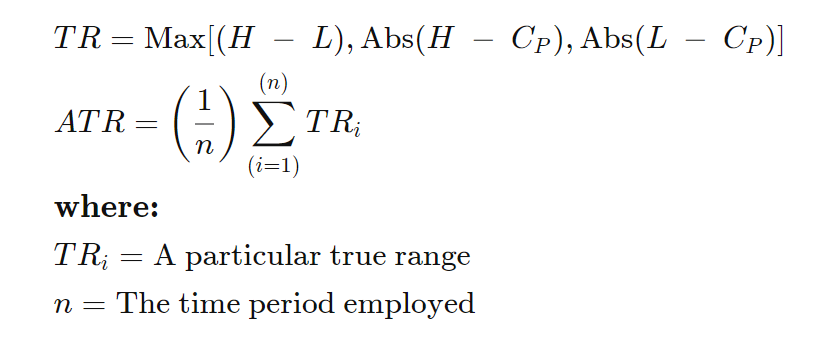



In [86]:
#Calculando as variáveis True Range e Average True Range | 14d:

for ativo in ativos:
    
    df_ativos.loc[df_ativos['Ativo'] == ativo,'16: True Range'] = np.nanmax([np.abs(df_ativos.loc[df_ativos['Ativo'] == ativo, 'High'] - df_ativos.loc[df_ativos['Ativo'] == ativo, 'Low']), 
                                                                            np.abs(df_ativos.loc[df_ativos['Ativo'] == ativo, 'High'] - df_ativos.loc[df_ativos['Ativo'] == ativo, 'Close'].shift(1)), 
                                                                            np.abs(df_ativos.loc[df_ativos['Ativo'] == ativo, 'Low'] - df_ativos.loc[df_ativos['Ativo'] == ativo, 'Close'].shift(1))], axis=0)
    
    
    df_ativos.loc[df_ativos['Ativo'] == ativo,'17: ATR 14d'] = df_ativos.loc[df_ativos['Ativo'] == ativo,'16: True Range'].rolling(window=14).mean()
    
    



In [87]:
#Calculando a variável MSI | 10d (corresponde à diferença de preços entre o dia atual e o décimo dia anterior. Detalhes: https://help.eaglesmarkets.com/hc/en-us/articles/900002105843-What-are-the-MTM-indicators-Detailed-explanation-of-MTM-index):

for ativo in ativos:
    
    df_ativos.loc[df_ativos['Ativo'] == ativo,'18: MI 10d'] = df_ativos.loc[df_ativos['Ativo'] == ativo, 'Close'] - df_ativos.loc[df_ativos['Ativo'] == ativo, 'Close'].shift(10)


In [88]:
#Função para calcular RSI: [Créditos para https://www.kaggle.com/mtszkw/xgboost-for-stock-trend-prices-prediction, levemente modificado para comportar diversos ativos]

def relative_strength_idx(df, ativo, n=14):
    close = df[df['Ativo']==ativo]['Close']
    delta = close.diff()
    pricesUp = delta.copy()
    pricesDown = delta.copy()
    pricesUp[pricesUp < 0] = 0
    pricesDown[pricesDown > 0] = 0
    rollUp = pricesUp.rolling(n).mean()
    rollDown = pricesDown.abs().rolling(n).mean()
    rs = rollUp / rollDown
    rsi = 100 - (100 / (1 + rs))
    return rsi

for ativo in ativos:

    df_ativos.loc[df_ativos['Ativo'] == ativo,'19: RSI 14d'] = relative_strength_idx(df_ativos,ativo)
    

In [89]:
df_ativos

,Open,High,Low,Close,Adj Close,Volume,Ativo,1: ln(C/C-1),2: ln(C-1/C-2),3: ln(C-2/C-3),...,10: ln(H-2/O-2),11: ln(H-3/O-3),12: ln(L/O),13: ln(L-1/O-1),14: ln(L-2/O-2),15: ln(L-3/O-3),16: True Range,17: ATR 14d,18: MI 10d,19: RSI 14d
2009-11-02,8.772292,9.632970,8.722638,9.504696,6.291415,265173584,600000.SS,NaN,NaN,NaN,...,NaN,NaN,-0.005676,NaN,NaN,NaN,0.910332,NaN,NaN,NaN
2009-11-02,8.600000,8.820000,8.570000,8.810000,6.917948,42974520,601186.SS,NaN,NaN,NaN,...,NaN,NaN,-0.003495,NaN,NaN,NaN,0.250000,NaN,NaN,NaN
2009-11-02,12.773433,13.999237,12.714232,13.960930,9.224529,79459915,601166.SS,NaN,NaN,NaN,...,NaN,NaN,-0.004645,NaN,NaN,NaN,1.285005,NaN,NaN,NaN
2009-11-02,7.350000,7.710000,7.300000,7.700000,6.815101,38635703,601111.SS,NaN,NaN,NaN,...,NaN,NaN,-0.006826,NaN,NaN,NaN,0.410000,NaN,NaN,NaN
2009-11-02,33.349998,35.799999,33.200001,35.689999,18.654739,20350805,601088.SS,NaN,NaN,NaN,...,NaN,NaN,-0.004508,NaN,NaN,NaN,2.599998,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-29,14.810000,14.840000,14.360000,14.480000,13.910461,59743226,600031.SS,-0.024558,-0.003364,-0.003352,...,0.012016,0.003341,-0.030856,-0.012146,-0.008769,-0.013477,0.480000,0.345000,0.589999,62.831866
2019-11-29,6.620000,6.640000,6.570000,6.610000,6.610000,15916007,600029.SS,-0.004528,-0.001505,-0.011958,...,0.002981,0.005961,-0.007581,-0.004535,-0.010503,-0.007502,0.070000,0.101429,0.000000,43.076939
2019-11-29,5.000000,5.010000,4.960000,4.990000,4.554284,45805196,600028.SS,-0.004000,-0.001994,-0.001990,...,0.003976,0.001986,-0.008032,-0.005994,-0.005994,-0.007984,0.050000,0.048572,0.140000,74.074009
2019-11-29,29.379999,29.660000,28.820000,29.090000,27.729485,40688958,600887.SS,-0.010600,-0.002717,0.004419,...,0.011553,0.011895,-0.019245,-0.008502,-0.005483,-0.003082,0.840000,0.545000,0.139999,51.515155


In [90]:
df_ativos_sna = df_ativos.dropna() #Muitas métricas precisam de mais dias de medição, de forma que os primeiros são nulos. Ao final, partimos do dia 20/11/2009 para a análise. Lembrando que aqui dropamos as ocorrências intrinsecamente ligadas a cada ativo, de forma que um ativo não atrapalha o outro.
df_ativos_sna

,Open,High,Low,Close,Adj Close,Volume,Ativo,1: ln(C/C-1),2: ln(C-1/C-2),3: ln(C-2/C-3),...,10: ln(H-2/O-2),11: ln(H-3/O-3),12: ln(L/O),13: ln(L-1/O-1),14: ln(L-2/O-2),15: ln(L-3/O-3),16: True Range,17: ATR 14d,18: MI 10d,19: RSI 14d
2009-11-20,6.080000,6.180000,6.010000,6.140000,6.106318,10077910,600156.SS,0.009820,0.018258,-0.005013,...,0.003339,0.035268,-0.011580,-0.011755,-0.020271,-0.006861,0.170000,0.194286,0.520000,78.260822
2009-11-20,4.213768,4.233142,4.175021,4.204082,2.267983,77086308,601988.SS,-0.006889,-0.002286,0.018434,...,0.016074,0.016185,-0.009238,-0.011481,-0.006969,-0.004673,0.058121,0.067808,0.164676,75.000185
2009-11-20,4.646666,4.691666,4.583333,4.641666,3.721854,27519906,600887.SS,-0.009293,0.002850,0.011482,...,0.025136,0.010714,-0.013724,-0.000714,-0.011704,-0.024719,0.108333,0.157024,0.478333,79.465748
2009-11-20,9.786071,9.844002,9.591591,9.773658,6.469447,237327779,600000.SS,-0.007592,-0.007534,-0.002499,...,0.007041,0.015994,-0.020073,-0.019345,-0.008766,-0.007886,0.256549,0.246794,-0.004138,61.732851
2009-11-20,14.107191,14.197734,13.859941,13.988790,9.242937,71807460,601166.SS,-0.016297,-0.012655,-0.009148,...,0.006452,0.019243,-0.017682,-0.028068,-0.016925,-0.004568,0.358687,0.397242,-0.107954,50.554026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-29,14.810000,14.840000,14.360000,14.480000,13.910461,59743226,600031.SS,-0.024558,-0.003364,-0.003352,...,0.012016,0.003341,-0.030856,-0.012146,-0.008769,-0.013477,0.480000,0.345000,0.589999,62.831866
2019-11-29,6.620000,6.640000,6.570000,6.610000,6.610000,15916007,600029.SS,-0.004528,-0.001505,-0.011958,...,0.002981,0.005961,-0.007581,-0.004535,-0.010503,-0.007502,0.070000,0.101429,0.000000,43.076939
2019-11-29,5.000000,5.010000,4.960000,4.990000,4.554284,45805196,600028.SS,-0.004000,-0.001994,-0.001990,...,0.003976,0.001986,-0.008032,-0.005994,-0.005994,-0.007984,0.050000,0.048572,0.140000,74.074009
2019-11-29,29.379999,29.660000,28.820000,29.090000,27.729485,40688958,600887.SS,-0.010600,-0.002717,0.004419,...,0.011553,0.011895,-0.019245,-0.008502,-0.005483,-0.003082,0.840000,0.545000,0.139999,51.515155


In [91]:
#Dúvida que não quer calar: Usar tudo pra fazer um modelo só (passando OneHotEncoder na feature 'Ativo' e deixando os preços dos ativos se autoinfluenciarem) ou fazer um modelo pra cada ativo?!

In [92]:
#Um modelo pra cada ativo parece fazer mais sentido... 
#Acho que o melhor caminho seria por um dicionário de DFs, uma entrada pra cada ativo.
#Separando os dataframes para cada Ativo em um dicionário, para  e gerar as features de interesse:

dict_ativos = {}

for ativo in ativos:
    dict_ativos[ativo] = df_ativos_sna[df_ativos_sna['Ativo']==ativo]
    

In [93]:
dict_ativos

{'600000.SS':                  Open       High        Low      Close  Adj Close     Volume  \
 2009-11-20   9.786071   9.844002   9.591591   9.773658   6.469447  237327779   
 2009-11-23   9.769520   9.781934   9.620556   9.761244   6.461230  199065555   
 2009-11-24   9.831588   9.860553   9.496420   9.521247   6.302371  310931094   
 2009-11-25   9.558488   9.620556   9.244010   9.591591   6.348933  270931594   
 2009-11-26   9.550213   9.550213   9.061943   9.099184   6.022995  326594191   
 ...               ...        ...        ...        ...        ...        ...   
 2019-11-25  12.030000  12.140000  12.000000  12.070000  10.896770   25153256   
 2019-11-26  12.150000  12.170000  11.980000  12.060000  10.887743   59633264   
 2019-11-27  12.070000  12.070000  11.900000  11.990000  10.824547   28703956   
 2019-11-28  12.000000  12.010000  11.920000  11.960000  10.797462   17797225   
 2019-11-29  11.930000  12.070000  11.890000  11.910000  10.752322   24566935   
 
             

In [94]:
#Fazendo um split do dataset em 80% treino, 20% teste e armazenando cada um em dicionário específico, já retirando as variáveis não desejadas: 

test_size  = 0.20

dict_train = {}
dict_test = {}

dict_X_train = {}
dict_X_test = {}

dict_y_train = {}
dict_y_test = {}


lista_drop = ['Open', 'High', 'Low', 'Adj Close', 'Volume',	'Ativo']

for ativo, df in dict_ativos.items():

    test_split_idx  = int(df.shape[0] * (1-test_size))

#Como a ideia é prever o preço do dia seguinte, vamos dar um shift na coluna 'Close'. 
#Teremos todas as features relacionadas ao mesmo dia, mas a variável de saída será o preço do dia seguinte.
  
    
    df['Close'] = df.loc[:,'Close'].shift(-1) #Gera um NA, então vamos ter que dropar novamente...
    df.dropna(inplace=True)
    
    df_train  = df.iloc[:test_split_idx].copy()
    df_test   = df.iloc[test_split_idx+1:].copy()
    
    X_train = df_train.drop(columns = lista_drop).drop(columns='Close')
    X_test = df_test.drop(columns = lista_drop).drop(columns='Close')
    
    y_train = df_train['Close']
    y_test = df_test['Close']

    dict_train[ativo] = df_train.drop(columns = lista_drop)
    dict_test[ativo] = df_test.drop(columns = lista_drop)
    
    dict_X_train[ativo] = X_train
    dict_X_test[ativo] = X_test
    
    dict_y_train[ativo] = y_train
    dict_y_test[ativo] = y_test

<ipython-input-94-d1b77a5251b1>:25: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-94-d1b77a5251b1>:26: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-94-d1b77a5251b1>:25: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-94-d1b77a5251b1>:26: SettingWithCopyWarning:


A value is trying

In [95]:
df_train

,Open,High,Low,Close,Adj Close,Volume,Ativo,1: ln(C/C-1),2: ln(C-1/C-2),3: ln(C-2/C-3),...,10: ln(H-2/O-2),11: ln(H-3/O-3),12: ln(L/O),13: ln(L-1/O-1),14: ln(L-2/O-2),15: ln(L-3/O-3),16: True Range,17: ATR 14d,18: MI 10d,19: RSI 14d
2009-11-20,4.213768,4.233142,4.175021,4.213768,2.267983,77086308,601988.SS,-0.006889,-0.002286,0.018434,...,0.016074,0.016185,-0.009238,-0.011481,-0.006969,-0.004673,0.058121,0.067808,0.164676,75.000185
2009-11-23,4.213768,4.233142,4.184708,4.116900,2.273209,63293791,601988.SS,0.002301,-0.006889,-0.002286,...,0.004556,0.016074,-0.006920,-0.009238,-0.011481,-0.006969,0.048434,0.067808,0.164676,75.609888
2009-11-24,4.242829,4.281576,4.107213,4.145961,2.220951,126624641,601988.SS,-0.023257,0.002301,-0.006889,...,0.004587,0.004556,-0.032486,-0.006920,-0.009238,-0.011481,0.174363,0.076111,0.058121,60.000039
2009-11-25,4.087840,4.145961,4.010345,4.000658,2.236629,112735634,601988.SS,0.007034,-0.023257,0.002301,...,0.004587,0.004587,-0.019139,-0.032486,-0.006920,-0.009238,0.135616,0.079570,0.087182,58.333385
2009-11-26,4.126587,4.126587,3.961911,3.913477,2.158242,133464362,601988.SS,-0.035676,0.007034,-0.023257,...,0.009091,0.004587,-0.040724,-0.019139,-0.032486,-0.006920,0.184050,0.085798,-0.029061,46.666612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-11-22,3.940000,4.040000,3.930000,4.000000,3.266042,404924420,601988.SS,0.027675,-0.005089,0.005089,...,0.012707,0.023108,-0.002541,-0.007643,-0.005128,-0.002601,0.120000,0.062143,0.080000,64.583307
2017-11-23,4.020000,4.070000,3.970000,4.000000,3.241729,328517393,601988.SS,-0.007472,0.027675,-0.005089,...,0.010101,0.012707,-0.012516,-0.002541,-0.007643,-0.005128,0.100000,0.065714,0.080000,61.999954
2017-11-24,3.990000,4.030000,3.960000,3.950000,3.241729,182082353,601988.SS,0.000000,-0.007472,0.027675,...,0.025064,0.010101,-0.007547,-0.012516,-0.002541,-0.007643,0.070000,0.067857,0.130000,63.265285
2017-11-27,3.990000,3.990000,3.900000,3.920000,3.201207,303061902,601988.SS,-0.012579,0.000000,-0.007472,...,0.012361,0.025064,-0.022815,-0.007547,-0.012516,-0.002541,0.100000,0.070000,0.060000,53.999989


In [96]:
#Acessando, por exemplo, o df_train do primeiro ativo:
list(dict_train.values())[0]

,Close,1: ln(C/C-1),2: ln(C-1/C-2),3: ln(C-2/C-3),4: ln(C-3/C-4),5: ln(H/O),6: ln(H/O-1),7: ln(H/O-2),8: ln(H/O-3),9: ln(H-1/O-1),10: ln(H-2/O-2),11: ln(H-3/O-3),12: ln(L/O),13: ln(L-1/O-1),14: ln(L-2/O-2),15: ln(L-3/O-3),16: True Range,17: ATR 14d,18: MI 10d,19: RSI 14d
2009-11-20,9.761244,-0.007592,-0.007534,-0.002499,0.001249,0.005902,-0.009205,-0.011285,-0.016674,0.005400,0.007041,0.015994,-0.020073,-0.019345,-0.008766,-0.007886,0.256549,0.246794,-0.004138,61.732851
2009-11-23,9.521247,-0.001271,-0.007592,-0.007534,-0.002499,0.001270,-0.000423,-0.015530,-0.017610,0.005902,0.005400,0.007041,-0.015365,-0.020073,-0.019345,-0.008766,0.161378,0.245021,0.033103,58.076923
2009-11-24,9.591591,-0.024894,-0.001271,-0.007592,-0.007534,0.002942,0.009275,0.007582,-0.007525,0.001270,0.005902,0.005400,-0.034686,-0.015365,-0.020073,-0.019345,0.364133,0.239110,-0.198618,37.686572
2009-11-25,9.099184,0.007361,-0.024894,-0.001271,-0.007592,0.006473,-0.021698,-0.015365,-0.017058,0.002942,0.001270,0.005902,-0.033454,-0.034686,-0.015365,-0.020073,0.376546,0.250341,-0.033103,43.223429
2009-11-26,8.879877,-0.052702,0.007361,-0.024894,-0.001271,0.000000,-0.000866,-0.029037,-0.022704,0.006473,0.002942,0.001270,-0.052480,-0.033454,-0.034686,-0.015365,0.529648,0.268962,-0.463442,28.645844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-11-30,12.910000,-0.002321,0.000000,-0.012289,0.000764,0.003094,0.000000,-0.006159,-0.010753,0.006926,0.003065,0.002289,-0.008557,-0.010870,-0.008478,-0.021622,0.150000,0.275714,0.520000,57.692306
2017-12-01,12.920000,0.000000,-0.002321,0.000000,-0.012289,0.001546,0.003094,0.000000,-0.006159,0.003094,0.006926,0.003065,-0.009324,-0.008557,-0.010870,-0.008478,0.139999,0.270000,0.130000,53.333326
2017-12-04,13.170000,0.000774,0.000000,-0.002321,0.000000,0.005424,0.000773,0.002321,-0.000773,0.001546,0.003094,0.006926,-0.002334,-0.009324,-0.008557,-0.010870,0.099999,0.261428,0.070000,60.958901
2017-12-05,12.960000,0.019165,0.000774,0.000000,-0.002321,0.026729,0.030607,0.025956,0.027504,0.005424,0.001546,0.003094,-0.000774,-0.002334,-0.009324,-0.008557,0.360001,0.281428,0.230000,66.666667


In [97]:
list(dict_train.values())[0]

,Close,1: ln(C/C-1),2: ln(C-1/C-2),3: ln(C-2/C-3),4: ln(C-3/C-4),5: ln(H/O),6: ln(H/O-1),7: ln(H/O-2),8: ln(H/O-3),9: ln(H-1/O-1),10: ln(H-2/O-2),11: ln(H-3/O-3),12: ln(L/O),13: ln(L-1/O-1),14: ln(L-2/O-2),15: ln(L-3/O-3),16: True Range,17: ATR 14d,18: MI 10d,19: RSI 14d
2009-11-20,9.761244,-0.007592,-0.007534,-0.002499,0.001249,0.005902,-0.009205,-0.011285,-0.016674,0.005400,0.007041,0.015994,-0.020073,-0.019345,-0.008766,-0.007886,0.256549,0.246794,-0.004138,61.732851
2009-11-23,9.521247,-0.001271,-0.007592,-0.007534,-0.002499,0.001270,-0.000423,-0.015530,-0.017610,0.005902,0.005400,0.007041,-0.015365,-0.020073,-0.019345,-0.008766,0.161378,0.245021,0.033103,58.076923
2009-11-24,9.591591,-0.024894,-0.001271,-0.007592,-0.007534,0.002942,0.009275,0.007582,-0.007525,0.001270,0.005902,0.005400,-0.034686,-0.015365,-0.020073,-0.019345,0.364133,0.239110,-0.198618,37.686572
2009-11-25,9.099184,0.007361,-0.024894,-0.001271,-0.007592,0.006473,-0.021698,-0.015365,-0.017058,0.002942,0.001270,0.005902,-0.033454,-0.034686,-0.015365,-0.020073,0.376546,0.250341,-0.033103,43.223429
2009-11-26,8.879877,-0.052702,0.007361,-0.024894,-0.001271,0.000000,-0.000866,-0.029037,-0.022704,0.006473,0.002942,0.001270,-0.052480,-0.033454,-0.034686,-0.015365,0.529648,0.268962,-0.463442,28.645844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-11-30,12.910000,-0.002321,0.000000,-0.012289,0.000764,0.003094,0.000000,-0.006159,-0.010753,0.006926,0.003065,0.002289,-0.008557,-0.010870,-0.008478,-0.021622,0.150000,0.275714,0.520000,57.692306
2017-12-01,12.920000,0.000000,-0.002321,0.000000,-0.012289,0.001546,0.003094,0.000000,-0.006159,0.003094,0.006926,0.003065,-0.009324,-0.008557,-0.010870,-0.008478,0.139999,0.270000,0.130000,53.333326
2017-12-04,13.170000,0.000774,0.000000,-0.002321,0.000000,0.005424,0.000773,0.002321,-0.000773,0.001546,0.003094,0.006926,-0.002334,-0.009324,-0.008557,-0.010870,0.099999,0.261428,0.070000,60.958901
2017-12-05,12.960000,0.019165,0.000774,0.000000,-0.002321,0.026729,0.030607,0.025956,0.027504,0.005424,0.001546,0.003094,-0.000774,-0.002334,-0.009324,-0.008557,0.360001,0.281428,0.230000,66.666667


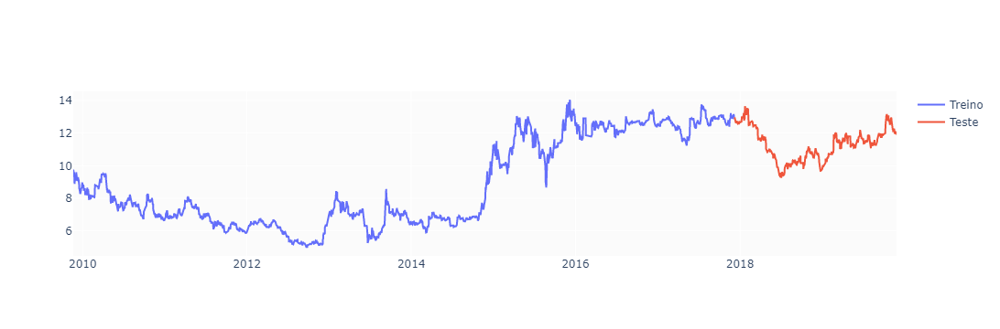

In [98]:
#Vamos ver a cara dessa bagaça e como ficaram temporalmente treino, validação e teste...
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(dict_train.values())[0].index, y=list(dict_train.values())[0].Close, name='Treino'))
fig.add_trace(go.Scatter(x=list(dict_test.values())[0].index,  y=list(dict_test.values())[0].Close,  name='Teste'))
fig.show()

In [99]:
#Ok, parece que temos tudo para começar a modelagem. Vamos ao que interessa...

In [100]:
#!pip install xgboost

In [101]:
#Vamos checar as variáveis de entrada para o primeiro ativo
list(dict_X_train.values())[0].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1916 entries, 2009-11-20 to 2017-12-06
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   1: ln(C/C-1)     1916 non-null   float64
 1   2: ln(C-1/C-2)   1916 non-null   float64
 2   3: ln(C-2/C-3)   1916 non-null   float64
 3   4: ln(C-3/C-4)   1916 non-null   float64
 4   5: ln(H/O)       1916 non-null   float64
 5   6: ln(H/O-1)     1916 non-null   float64
 6   7: ln(H/O-2)     1916 non-null   float64
 7   8: ln(H/O-3)     1916 non-null   float64
 8   9: ln(H-1/O-1)   1916 non-null   float64
 9   10: ln(H-2/O-2)  1916 non-null   float64
 10  11: ln(H-3/O-3)  1916 non-null   float64
 11  12: ln(L/O)      1916 non-null   float64
 12  13: ln(L-1/O-1)  1916 non-null   float64
 13  14: ln(L-2/O-2)  1916 non-null   float64
 14  15: ln(L-3/O-3)  1916 non-null   float64
 15  16: True Range   1916 non-null   float64
 16  17: ATR 14d      1916 non-null   float64
 

In [102]:
param = {
    'learning_rate': [0.1, 0.2, 0.3],
    'n_estimators': [600, 700, 800], 
    'max_depth': [3, 5, 8],
    'reg_alpha': [1e-5, 1e-2, 0.1, 1, 100], 
    'reg_lambda': [1e-5, 1e-2, 0.1, 1, 100],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0.005, 0.01, 0.02, 0.01, 0.5, 1, 2], 
    'min_child_weight': [1, 5, 10, 15],
    'random_state': [248]
}

#eval_set = [(list(dict_X_train.values())[0], (list(dict_y_train.values())[0])), (list(dict_X_valid.values())[0], (list(dict_y_valid.values())[0]))]
#eval_set = [(X_train, y_train), (X_valid, y_valid)]

model = xgb.XGBRegressor(objective='reg:squarederror', eval_metric = 'rmse')

k = 5

grid_s = RandomizedSearchCV(model, param, cv = k, n_iter= 100, verbose = 2, n_jobs = -1)

grid_s.fit(list(dict_X_train.values())[0], list(dict_y_train.values())[0])

print(f'Best params: {grid_s.best_params_}')
print(f'Best validation score = {grid_s.best_score_}')

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done 150 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 353 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  5.1min finished


Best params: {'reg_lambda': 100, 'reg_alpha': 0.1, 'random_state': 248, 'n_estimators': 600, 'min_child_weight': 15, 'max_depth': 3, 'learning_rate': 0.3, 'gamma': 0.01, 'colsample_bytree': 0.8}
Best validation score = -16.0369411201096


In [104]:
#Setando o melhor modelo:

model = xgb.XGBRegressor(**grid_s.best_params_, objective='reg:squarederror', eval_metric = 'rmse')
model.fit(list(dict_X_train.values())[0], list(dict_y_train.values())[0])

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, eval_metric='rmse',
             gamma=0.01, gpu_id=-1, importance_type='gain',
             interaction_constraints='', learning_rate=0.3, max_delta_step=0,
             max_depth=3, min_child_weight=15, missing=nan,
             monotone_constraints='()', n_estimators=600, n_jobs=6,
             num_parallel_tree=1, random_state=248, reg_alpha=0.1,
             reg_lambda=100, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

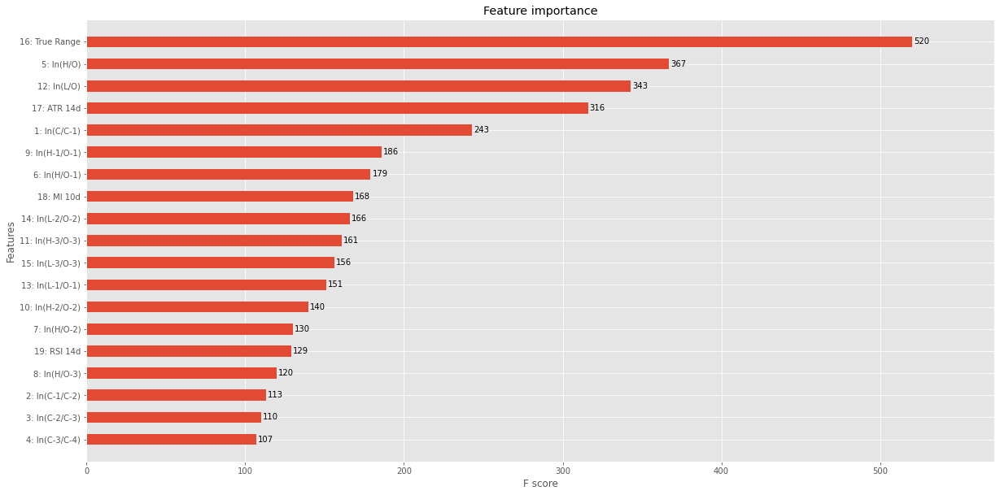

In [105]:
#Olhando Feature Importance:
plt.rcParams["figure.figsize"] = (20, 10)
plot_importance(model, height = 0.5)

In [106]:
#Verificando performance do modelo para o conjunto de testes desse primeiro ativo:

y_pred_train = model.predict(list(dict_X_train.values())[0])
y_pred_test = model.predict(list(dict_X_test.values())[0])

print(f'Treino: mean_squared_error = {mean_squared_error(list(dict_y_train.values())[0], y_pred_train)}')
print(f'Teste: mean_squared_error = {mean_squared_error(list(dict_y_test.values())[0], y_pred_test)}')

Treino: mean_squared_error = 0.07481066225730051
Teste: mean_squared_error = 0.8141598671634803


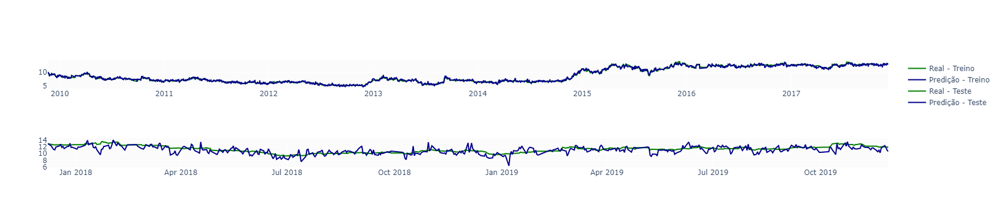

In [107]:
#Visualização para este único ativo:

pred_close_train = list(dict_train.values())[0].copy()
pred_close_test = list(dict_test.values())[0].copy()
pred_close = pd.concat([pred_close_train, pred_close_test ])

plt.rcParams["figure.figsize"] = (100, 20)
fig = make_subplots(rows=3, cols=1, )

fig.add_trace(go.Scatter(x=pred_close_train.index, y=list(dict_train.values())[0]['Close'],
                         name='Real - Treino',
                         marker_color='Green'), row=1, col=1)

fig.add_trace(go.Scatter(x=pred_close_train.index,
                         y=y_pred_train,
                         name='Predição - Treino',
                         marker_color='DarkBlue'), row=1, col=1)

fig.add_trace(go.Scatter(x=pred_close_test.index, y=list(dict_test.values())[0]['Close'],
                         name='Real - Teste',
                         marker_color='Green'), row=3, col=1)

fig.add_trace(go.Scatter(x=pred_close_test.index,
                         y=y_pred_test,
                         name='Predição - Teste',
                         marker_color='DarkBlue'), row=3, col=1)

fig.show()

## O Artigo trouxe as seguintes métricas, comparando o seu modelo aos outros testados:

<div>
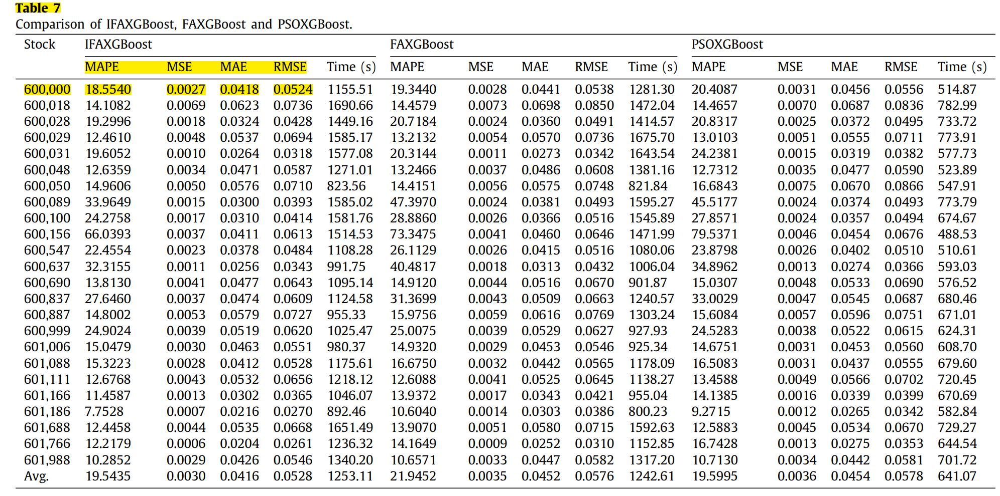
</div>


In [45]:
#Comparando MAPE, MSE, MAE e RMSE obtidos para o primeiro ativo com os do modelo do paper:

#from sklearn.metrics import mean_absolute_percentage_error -> Dando erro
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

#MAPE = mean_absolute_percentage_error(y_true = list(dict_test.values())[0]['Close'], y_pred = y_pred_test) -> Fazer na mão grande
MAPE_test = np.mean(np.abs((list(dict_test.values())[0]['Close'] - y_pred_test)/list(dict_test.values())[0]['Close']))
MSE_test = mean_squared_error(y_true = list(dict_test.values())[0]['Close'], y_pred = y_pred_test, squared = False)
MAE_test = mean_absolute_error(y_true = list(dict_test.values())[0]['Close'], y_pred = y_pred_test)
RMSE_test = mean_squared_error(y_true = list(dict_test.values())[0]['Close'], y_pred = y_pred_test, squared = True)

print("Performance prevendo o Ativo 600.000 (Teste):")
print(f'MAPE = {MAPE_test:.4f}')
print(f'MSE = {MSE_test:.4f}')
print(f'MAE = {MAE_test:.4f}')
print(f'RMSE = {RMSE_test:.4f}')

Performance prevendo o Ativo 600.000 (Teste):
MAPE = 0.0687
MSE = 0.9968
MAE = 0.7764
RMSE = 0.9936


In [46]:
#Checando as mesmas métricas no treino:

MAPE_train = np.mean(np.abs((list(dict_train.values())[0]['Close'] - y_pred_train)/list(dict_train.values())[0]['Close']))
MSE_train = mean_squared_error(y_true = list(dict_train.values())[0]['Close'], y_pred = y_pred_train, squared = False)
MAE_train = mean_absolute_error(y_true = list(dict_train.values())[0]['Close'], y_pred = y_pred_train)
RMSE_train = mean_squared_error(y_true = list(dict_train.values())[0]['Close'], y_pred = y_pred_train, squared = True)

print("Performance no treino com o Ativo 600.000:")
print(f'MAPE = {MAPE_train:.4f}')
print(f'MSE = {MSE_train:.4f}')
print(f'MAE = {MAE_train:.4f}')
print(f'RMSE = {RMSE_train:.4f}')

Performance no treino com o Ativo 600.000:
MAPE = 0.0081
MSE = 0.0889
MAE = 0.0663
RMSE = 0.0079


In [120]:
#Melhorar o tunning com base nos melhores parâmetros obtidos.

### Referência interessante em: https://www.kaggle.com/mtszkw/xgboost-for-stock-trend-prices-prediction
### Biblioteca de params XGBoost: https://github.com/dmlc/xgboost/blob/master/doc/parameter.rst#parameters-for-tree-booster
### GridSearch com crossval (atenção que é clf, não reg): https://www.kaggle.com/tilii7/hyperparameter-grid-search-with-xgboost

## Próximos passos: 

* Entender com Abner o melhor approach para fitar os modelos para cada ativo (dicionário funciona, mas talvez seja mais simples) ;
* Melhorar o tunning do modelo -> Tentar implementar o IFA?
* Implementar a seleção de portfólio -> Mean-Variance;
* Testar com as cryptos e fazer o tunning novamente;
* Deploy!


In [ ]:
#Abner
#https://github.com/firefly-cpp/FireflyAlgorithm

# D é o tamanho do vagalume (# de hiperparametros)
# sol é um vagalume (uma combinação de hyperparametros)
def Fun(D, sol):

    xgb = (max_depth = sol[0], min_ = sol[1], ...) #cria o xgboost
    xfgb.fit(X_train, y_train)
    y_pred = xgb.predict(X_test)
    erro = rmse(y_pred, y_test)        
    return erro

#fireflies = [ [ 0.1, 3, 0.01 ], [ 0.01, 2, 0.02 ]  ]

Algorithm = FireflyAlgorithm(3, 2, 10000, 0.5, 0.2, 1.0, -2.0, 2.0, Fun)
Best = Algorithm.Run()

print Best

# Definindo uma função para rodar modelo, mostrar resultados e plotar feature importance, além de armazenar tudo num DF:

In [484]:
cols_params=['learning_rate', 'n_estimators', 'max_depth', 'min_child_weight', 'gamma', 'colsample_bytree', 'reg_alpha', 'reg_lambda'] 
cols_results = ['MAPE_train', 'MAPE_test', 'MSE_train', 'MSE_test', 'MAE_train', 'MAE_test', 'RMSE_train', 'RMSE_test']
cols_params.extend(cols_results)
df_model = pd.DataFrame(columns = cols_params)
df_model

,learning_rate,n_estimators,max_depth,min_child_weight,gamma,colsample_bytree,reg_alpha,reg_lambda,MAPE_train,MAPE_test,MSE_train,MSE_test,MAE_train,MAE_test,RMSE_train,RMSE_test


In [485]:
# Créditos: https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/

def model_fit(estimator, dtrain, dtest, features, target, dmodel, cv_folds=10, early_stopping_rounds=50):
    
    xgb_param = estimator.get_xgb_params()
    
    xgtrain = xgb.DMatrix(data = dtrain[features].values, label = dtrain[target].values)
    
    cvresult = xgb.cv(xgb_param, xgtrain, num_boost_round = estimator.get_params()['n_estimators'], nfold = cv_folds,
                      metrics ='rmse', early_stopping_rounds = early_stopping_rounds, verbose_eval = True)
    
    estimator.set_params(n_estimators=cvresult.shape[0])
    
  
        
    
    #Fit the algorithm on the data
    
    estimator.fit(dtrain[features], dtrain[target], eval_metric='rmse')
        
    #Predict training set:
    dtrain_predictions = estimator.predict(dtrain[features])
    
        
    #Printar resultados no treino:
    print ("\nResultados do modelo no treino")
    #print ("Accuracy : %.4g" % metrics.accuracy_score(df_train['Disbursed'].values, df_train_predictions))
    
    #MAPE = mean_absolute_percentage_error(y_true = list(dict_test.values())[0]['Close'], y_pred = y_pred_test) -> Fazer na mão grande
    MAPE_train = np.mean(np.abs((dtrain[target].values - dtrain_predictions)/dtrain[target].values))
    MSE_train = mean_squared_error(y_true = dtrain[target].values, y_pred = dtrain_predictions, squared = False)
    MAE_train = mean_absolute_error(y_true = dtrain[target].values, y_pred = dtrain_predictions)
    RMSE_train = mean_squared_error(y_true = dtrain[target].values, y_pred = dtrain_predictions, squared = True)
    
    print(f'MAPE = {MAPE_train:.4f}')
    print(f'MSE = {MSE_train:.4f}')
    print(f'MAE = {MAE_train:.4f}')
    print(f'RMSE = {RMSE_train:.4f}')
    
    
    #Prever e printar resultados no teste:
    
    dtest_predictions = estimator.predict(dtest[features])
    
    #MAPE = mean_absolute_percentage_error(y_true = list(dict_test.values())[0]['Close'], y_pred = y_pred_test) -> Fazer na mão grande
    MAPE_test = np.mean(np.abs((dtest[target].values - dtest_predictions)/dtest[target].values))
    MSE_test = mean_squared_error(y_true = dtest[target].values, y_pred = dtest_predictions, squared = False)
    MAE_test = mean_absolute_error(y_true = dtest[target].values, y_pred = dtest_predictions)
    RMSE_test = mean_squared_error(y_true = dtest[target].values, y_pred = dtest_predictions, squared = True)

    print ("\nResultados do modelo no teste")
    print(f'MAPE = {MAPE_test:.4f}')
    print(f'MSE = {MSE_test:.4f}')
    print(f'MAE = {MAE_test:.4f}')
    print(f'RMSE = {RMSE_test:.4f}')
    
   
    
    #Plotar gráfico treino e teste:
    
    print ("\n")
    print ("Time Series de treino e teste:")

    plt.rcParams["figure.figsize"] = (100, 20)
    fig = make_subplots(rows=3, cols=1, )

    fig.add_trace(go.Scatter(x = dtrain.index, y = dtrain[target].values,
                             name='Real - Treino',
                             marker_color='Green'), row=1, col=1)

    fig.add_trace(go.Scatter(x = dtrain.index,
                             y = dtrain_predictions,
                             name='Predição - Treino',
                             marker_color='DarkBlue'), row=1, col=1)

    fig.add_trace(go.Scatter(x = dtest.index, y = dtest[target].values,
                             name='Real - Teste',
                             marker_color='Green'), row=3, col=1)

    fig.add_trace(go.Scatter(x = dtest.index,
                             y = dtest_predictions,
                             name='Predição - Teste',
                             marker_color='DarkBlue'), row=3, col=1)

    fig.show()
    
     
    #Plotar feature importance:
    
    print ("\n")
    plt.rcParams["figure.figsize"] = (20, 10)
    plot_importance(estimator, height = 0.5)
    
    #Armazenando os parâmetros e resultados em um DF:
    
    params_results = []
    
    cols_params=['learning_rate', 'n_estimators', 'max_depth', 'min_child_weight', 'gamma', 'colsample_bytree', 'reg_alpha', 'reg_lambda'] 
    cols_results = ['MAPE_train', 'MAPE_test', 'MSE_train', 'MSE_test', 'MAE_train', 'MAE_test', 'RMSE_train', 'RMSE_test']
    
    for i in range(len(cols_params)):
        params_results.append(estimator.get_params()[cols_params[i]])
    
    params_results.extend([MAPE_train, MAPE_test, MSE_train, MSE_test, MAE_train, MAE_test, RMSE_train, RMSE_test])
    
    dmodel.loc[len(dmodel)] = params_results
    print ("DataFrame consolidado de parâmetros e resultados tentados até aqui:")
    
    return dmodel
    print ("\n")
    

## Step 1: Fix learning rate and number of estimators for tuning tree-based parameters

[0]	train-rmse:7.91506+0.01660	test-rmse:7.92221+0.16432
[1]	train-rmse:7.18162+0.01461	test-rmse:7.19536+0.16460
[2]	train-rmse:6.52161+0.01385	test-rmse:6.54294+0.15825
[3]	train-rmse:5.93190+0.01387	test-rmse:5.96130+0.15729
[4]	train-rmse:5.39821+0.01834	test-rmse:5.44083+0.15139
[5]	train-rmse:4.92080+0.01624	test-rmse:4.97209+0.15321
[6]	train-rmse:4.49288+0.01762	test-rmse:4.55180+0.15259
[7]	train-rmse:4.10736+0.01725	test-rmse:4.17863+0.15094
[8]	train-rmse:3.76035+0.01544	test-rmse:3.84268+0.14950
[9]	train-rmse:3.44994+0.01804	test-rmse:3.54558+0.14605
[10]	train-rmse:3.16657+0.01502	test-rmse:3.27679+0.14368
[11]	train-rmse:2.91272+0.01752	test-rmse:3.03636+0.13770
[12]	train-rmse:2.68902+0.01505	test-rmse:2.82847+0.13895
[13]	train-rmse:2.48795+0.01909	test-rmse:2.63878+0.13966
[14]	train-rmse:2.30378+0.01875	test-rmse:2.47308+0.14196
[15]	train-rmse:2.14491+0.01816	test-rmse:2.32939+0.14460
[16]	train-rmse:1.99278+0.01806	test-rmse:2.19339+0.13647
[17]	train-rmse:1.86365+

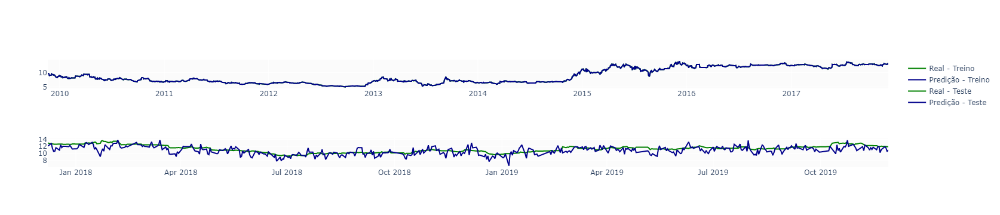



DataFrame consolidado de parâmetros e resultados tentados até aqui:


,learning_rate,n_estimators,max_depth,min_child_weight,gamma,colsample_bytree,reg_alpha,reg_lambda,MAPE_train,MAPE_test,MSE_train,MSE_test,MAE_train,MAE_test,RMSE_train,RMSE_test
0,0.1,806.0,5.0,1.0,0.0,0.8,0.0,1.0,0.001013,0.069134,0.011246,0.999326,0.008335,0.783562,0.000126,0.998652


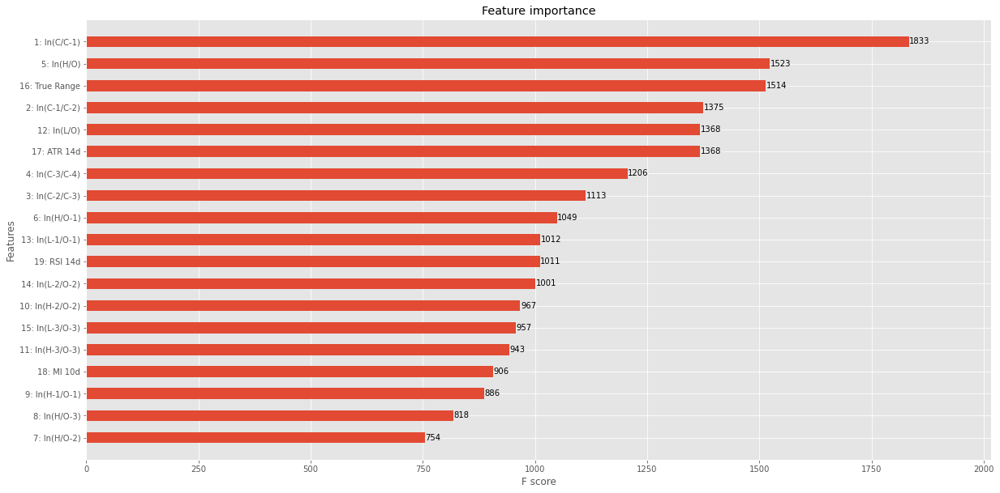

In [486]:
#Vamos setar learning_rate para 0.1 e n_etimators para 1000. A ideia é tunar apenas os parâmetros específicos de árvores, que vão começar como segue:

xgb1 = xgb.XGBRegressor(
         learning_rate =0.1,
         n_estimators=1000,
         max_depth=5,
         min_child_weight=1,
         gamma=0,
         colsample_bytree=0.8,
         subsample = 0.8,
         objective= 'reg:squarederror',
         nthread=6,
         seed=248)

model_fit(estimator = xgb1, dtrain = list(dict_train.values())[0], dtest = list(dict_test.values())[0], features = list(dict_X_train.values())[0].columns, target = 'Close', dmodel = df_model, cv_folds=10, early_stopping_rounds=50)

Como o erro continuou caindo até o 856º estimador, vamos atribuir esse valor a n_estimator. Percebemos que há claramente um overfitting quando observamos a série temporal de treino.

## Step 2: Tune max_depth and min_child_weight
We tune these first as they will have the highest impact on model outcome. To start with, let’s set wider ranges and then we will perform another iteration for smaller ranges.

In [487]:
param_test1 = {
 'max_depth':range(3,10,2),
 'min_child_weight':range(1,6,2)
}
gsearch1 = GridSearchCV(estimator = xgb.XGBRegressor( learning_rate =0.1, n_estimators=856, max_depth=5,
                         min_child_weight=1, gamma=0, colsample_bytree=0.8, subsample = 0.8,
                         objective= 'reg:squarederror', seed=248), 
                         param_grid = param_test1, n_jobs= -1, cv=5, verbose=2)

gsearch1.fit(list(dict_X_train.values())[0], list(dict_y_train.values())[0])
gsearch1.cv_results_['params'], gsearch1.best_params_, gsearch1.best_score_

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   22.0s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   45.1s finished


([{'max_depth': 3, 'min_child_weight': 1},
  {'max_depth': 3, 'min_child_weight': 3},
  {'max_depth': 3, 'min_child_weight': 5},
  {'max_depth': 5, 'min_child_weight': 1},
  {'max_depth': 5, 'min_child_weight': 3},
  {'max_depth': 5, 'min_child_weight': 5},
  {'max_depth': 7, 'min_child_weight': 1},
  {'max_depth': 7, 'min_child_weight': 3},
  {'max_depth': 7, 'min_child_weight': 5},
  {'max_depth': 9, 'min_child_weight': 1},
  {'max_depth': 9, 'min_child_weight': 3},
  {'max_depth': 9, 'min_child_weight': 5}],
 {'max_depth': 3, 'min_child_weight': 5},
 -19.35409017289307)

Encontramos os melhores valores. Para aprofundar, vamos aumentar a granularidade do teste variando os best_params em +1 e -1.

In [488]:
param_test2 = {
 'max_depth':[2, 3, 4],
 'min_child_weight':[4, 5, 6]
}
gsearch2 = GridSearchCV(estimator = xgb.XGBRegressor( learning_rate =0.1, n_estimators=1000, max_depth=5,
                         min_child_weight=1, gamma=0, colsample_bytree=0.8, subsample = 0.8,
                         objective= 'reg:squarederror', seed=248), 
                         param_grid = param_test2, n_jobs= -1, cv=5, verbose=2)

gsearch2.fit(list(dict_X_train.values())[0], list(dict_y_train.values())[0])
gsearch2.cv_results_['params'], gsearch1.best_params_, gsearch1.best_score_

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:   23.1s finished


([{'max_depth': 2, 'min_child_weight': 4},
  {'max_depth': 2, 'min_child_weight': 5},
  {'max_depth': 2, 'min_child_weight': 6},
  {'max_depth': 3, 'min_child_weight': 4},
  {'max_depth': 3, 'min_child_weight': 5},
  {'max_depth': 3, 'min_child_weight': 6},
  {'max_depth': 4, 'min_child_weight': 4},
  {'max_depth': 4, 'min_child_weight': 5},
  {'max_depth': 4, 'min_child_weight': 6}],
 {'max_depth': 3, 'min_child_weight': 5},
 -19.35409017289307)

Permanecemos com os valores encontrados como os melhores parâmetros.

## Step 3: Tune gamma
Now lets tune gamma value using the parameters already tuned above. Gamma can take various values but I’ll check for 5 values here. 

In [489]:
param_test3 = {
 'gamma':[i/10.0 for i in range(0,5)]
}
gsearch3 = GridSearchCV(estimator = xgb.XGBRegressor( learning_rate =0.1, n_estimators=1000, max_depth=3,
                         min_child_weight=5, gamma=0, colsample_bytree=0.8, subsample = 0.8,
                         objective= 'reg:squarederror', seed=248), 
                         param_grid = param_test3, n_jobs= -1, cv=5, verbose=2)

gsearch3.fit(list(dict_X_train.values())[0], list(dict_y_train.values())[0])
gsearch3.cv_results_['params'], gsearch3.best_params_, gsearch3.best_score_

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:   12.1s finished


([{'gamma': 0.0},
  {'gamma': 0.1},
  {'gamma': 0.2},
  {'gamma': 0.3},
  {'gamma': 0.4}],
 {'gamma': 0.0},
 -19.093676728601928)

"gamma" = 0 é o valor ótimo. Agora que fizemos esse passo, é importante voltar a avaliar o n_estimators. Vamos lá:

[0]	train-rmse:7.92154+0.01735	test-rmse:7.92318+0.16965
[1]	train-rmse:7.19902+0.01580	test-rmse:7.19960+0.16578
[2]	train-rmse:6.55395+0.01448	test-rmse:6.55831+0.16217
[3]	train-rmse:5.97883+0.01323	test-rmse:5.98601+0.16112
[4]	train-rmse:5.46577+0.01489	test-rmse:5.48017+0.15940
[5]	train-rmse:5.00832+0.01446	test-rmse:5.02778+0.16104
[6]	train-rmse:4.60159+0.01534	test-rmse:4.62506+0.16041
[7]	train-rmse:4.23799+0.01419	test-rmse:4.26897+0.16143
[8]	train-rmse:3.91546+0.01647	test-rmse:3.95084+0.16184
[9]	train-rmse:3.63057+0.01637	test-rmse:3.67299+0.15852
[10]	train-rmse:3.37806+0.01539	test-rmse:3.42513+0.15859
[11]	train-rmse:3.15657+0.01436	test-rmse:3.21096+0.15561
[12]	train-rmse:2.95533+0.01428	test-rmse:3.02176+0.15791
[13]	train-rmse:2.78146+0.01555	test-rmse:2.85389+0.16274
[14]	train-rmse:2.62501+0.01722	test-rmse:2.70566+0.16394
[15]	train-rmse:2.48554+0.02025	test-rmse:2.57513+0.16291
[16]	train-rmse:2.36685+0.02257	test-rmse:2.46536+0.16224
[17]	train-rmse:2.26076+

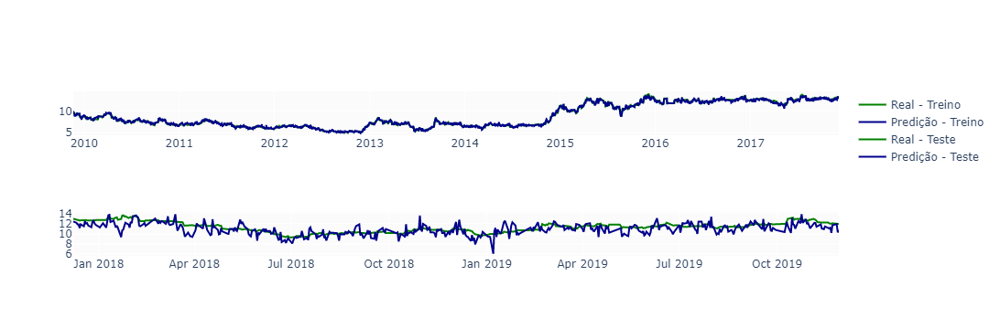



DataFrame consolidado de parâmetros e resultados tentados até aqui:


,learning_rate,n_estimators,max_depth,min_child_weight,gamma,colsample_bytree,reg_alpha,reg_lambda,MAPE_train,MAPE_test,MSE_train,MSE_test,MAE_train,MAE_test,RMSE_train,RMSE_test
0,0.1,806.0,5.0,1.0,0.0,0.8,0.0,1.0,0.001013,0.069134,0.011246,0.999326,0.008335,0.783562,0.000126,0.998652
1,0.1,1000.0,3.0,5.0,0.0,0.8,0.0,1.0,0.017518,0.066185,0.196062,0.953512,0.147014,0.751450,0.038440,0.909186


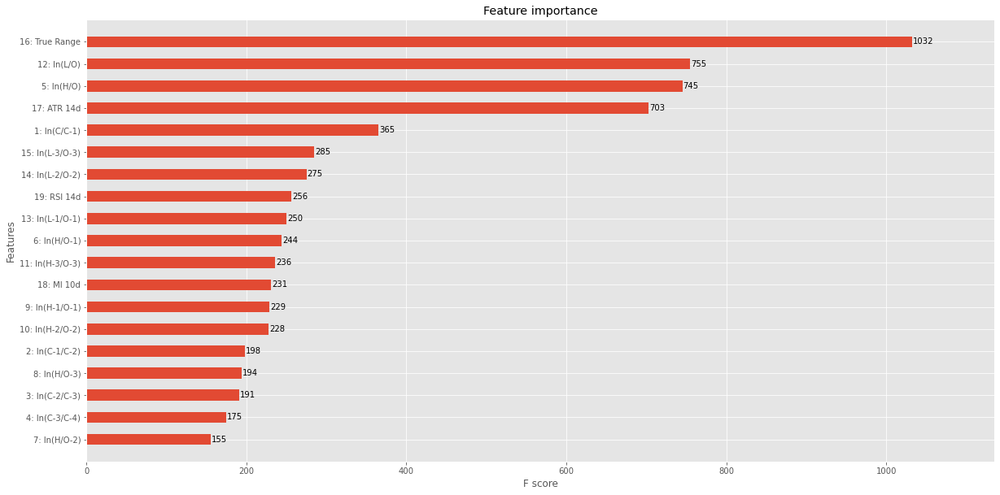

In [490]:
xgb2 = xgb.XGBRegressor(
         learning_rate =0.1,
         n_estimators=1000,
         max_depth=3,
         min_child_weight=5,
         gamma=0,
         colsample_bytree=0.8,
         objective= 'reg:squarederror',
         nthread=6,
         seed=248)

model_fit(estimator = xgb2, dtrain = list(dict_train.values())[0], dtest = list(dict_test.values())[0], features = list(dict_X_train.values())[0].columns, target = 'Close', dmodel = df_model, cv_folds=10, early_stopping_rounds=50)

"n_estimators" deve voltar para 1000, já que o aumento da quantidade de árvores se justifica pela diminuição no erro.

## Step 4: Tune subsample and colsample_bytree
The next step would be try different subsample and colsample_bytree values. Lets do this in 2 stages as well and take values 0.6,0.7,0.8,0.9 for both to start with.

In [492]:
param_test4 = {
 'subsample':[i/10.0 for i in range(6,10)], #No inicio não tinha considerado ele... Checar tudo para incluir desde o inicio, inclusive o df_model
 'colsample_bytree':[i/10.0 for i in range(6,10)]
}
gsearch4 = GridSearchCV(estimator = xgb.XGBRegressor( learning_rate =0.1, n_estimators=1000, max_depth=3,
                         min_child_weight=5, gamma=0, subsample = 0.8, colsample_bytree=0.8,
                         objective= 'reg:squarederror', seed=248), 
                         param_grid = param_test4, n_jobs= -1, cv=5, verbose=2)

gsearch4.fit(list(dict_X_train.values())[0], list(dict_y_train.values())[0])
gsearch4.cv_results_['params'], gsearch4.best_params_, gsearch4.best_score_

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:   44.0s finished


([{'colsample_bytree': 0.6, 'subsample': 0.6},
  {'colsample_bytree': 0.6, 'subsample': 0.7},
  {'colsample_bytree': 0.6, 'subsample': 0.8},
  {'colsample_bytree': 0.6, 'subsample': 0.9},
  {'colsample_bytree': 0.7, 'subsample': 0.6},
  {'colsample_bytree': 0.7, 'subsample': 0.7},
  {'colsample_bytree': 0.7, 'subsample': 0.8},
  {'colsample_bytree': 0.7, 'subsample': 0.9},
  {'colsample_bytree': 0.8, 'subsample': 0.6},
  {'colsample_bytree': 0.8, 'subsample': 0.7},
  {'colsample_bytree': 0.8, 'subsample': 0.8},
  {'colsample_bytree': 0.8, 'subsample': 0.9},
  {'colsample_bytree': 0.9, 'subsample': 0.6},
  {'colsample_bytree': 0.9, 'subsample': 0.7},
  {'colsample_bytree': 0.9, 'subsample': 0.8},
  {'colsample_bytree': 0.9, 'subsample': 0.9}],
 {'colsample_bytree': 0.9, 'subsample': 0.6},
 -18.586386715998398)

Agora que encontramos os melhores valores, vamos aumentar a granularidade para 0.05 e observar:

In [493]:
param_test5 = {
 'subsample':[i/100.0 for i in range(55,70,5)],
 'colsample_bytree':[i/100.0 for i in range(85,100,5)]
}

gsearch5 = GridSearchCV(estimator = xgb.XGBRegressor( learning_rate =0.1, n_estimators=1000, max_depth=3,
                         min_child_weight=5, gamma=0, subsample = 0.8, colsample_bytree=0.8,
                         objective= 'reg:squarederror', seed=248), 
                         param_grid = param_test5, n_jobs= -1, cv=5, verbose=2)

gsearch5.fit(list(dict_X_train.values())[0], list(dict_y_train.values())[0])
gsearch5.cv_results_['params'], gsearch4.best_params_, gsearch4.best_score_

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:   21.5s finished


([{'colsample_bytree': 0.85, 'subsample': 0.55},
  {'colsample_bytree': 0.85, 'subsample': 0.6},
  {'colsample_bytree': 0.85, 'subsample': 0.65},
  {'colsample_bytree': 0.9, 'subsample': 0.55},
  {'colsample_bytree': 0.9, 'subsample': 0.6},
  {'colsample_bytree': 0.9, 'subsample': 0.65},
  {'colsample_bytree': 0.95, 'subsample': 0.55},
  {'colsample_bytree': 0.95, 'subsample': 0.6},
  {'colsample_bytree': 0.95, 'subsample': 0.65}],
 {'colsample_bytree': 0.9, 'subsample': 0.6},
 -18.586386715998398)

Valores não se alteraram.

## Step 5: Tuning Regularization Parameters
Next step is to apply regularization to reduce overfitting. Though many people don’t use this parameters much as gamma provides a substantial way of controlling complexity. But we should always try it. I’ll tune ‘reg_alpha’ value here and leave it upto you to try different values of ‘reg_lambda’.

In [494]:
param_test6 = {
 'reg_alpha':[1e-5, 1e-2, 0.1, 1, 100]
}
gsearch6 = GridSearchCV(estimator = xgb.XGBRegressor( learning_rate =0.1, n_estimators=1000, max_depth=3,
                         min_child_weight=5, gamma=0, subsample=0.6, colsample_bytree=0.9,
                         objective= 'reg:squarederror', seed=248), 
                         param_grid = param_test6, n_jobs= -1, cv=5, verbose=2)

gsearch6.fit(list(dict_X_train.values())[0], list(dict_y_train.values())[0])
gsearch6.cv_results_['params'], gsearch6.best_params_, gsearch6.best_score_

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:   11.9s finished


([{'reg_alpha': 1e-05},
  {'reg_alpha': 0.01},
  {'reg_alpha': 0.1},
  {'reg_alpha': 1},
  {'reg_alpha': 100}],
 {'reg_alpha': 0.01},
 -18.32881146616007)

Temos uma ideia da magnitude do reg_alpha ideal (~0.01). Vamos explorar um pouco mais aumentando a granularidade:

In [495]:
param_test7 = {
 'reg_alpha':[0, 0.001, 0.005, 0.01, 0.05]
}
gsearch7 = GridSearchCV(estimator = xgb.XGBRegressor( learning_rate =0.1, n_estimators=1000, max_depth=3,
                         min_child_weight=5, gamma=0, subsample=0.6, colsample_bytree=0.9,
                         objective= 'reg:squarederror', seed=248), 
                         param_grid = param_test7, n_jobs= -1, cv=5, verbose=2)

gsearch7.fit(list(dict_X_train.values())[0], list(dict_y_train.values())[0])
gsearch7.cv_results_['params'], gsearch7.best_params_, gsearch7.best_score_

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:   12.5s finished


([{'reg_alpha': 0},
  {'reg_alpha': 0.001},
  {'reg_alpha': 0.005},
  {'reg_alpha': 0.01},
  {'reg_alpha': 0.05}],
 {'reg_alpha': 0.01},
 -18.32881146616007)

reg_alpha = 0.01 confirmou ser o melhor valor.
Agora vamos rodar mais uma vez o modelo para verificar n_estimators e os resultados finais:

[0]	train-rmse:7.92950+0.01719	test-rmse:7.92990+0.16880
[1]	train-rmse:7.20689+0.01485	test-rmse:7.20826+0.16747
[2]	train-rmse:6.56294+0.01345	test-rmse:6.56821+0.16434
[3]	train-rmse:5.98758+0.01290	test-rmse:5.99705+0.16058
[4]	train-rmse:5.47483+0.01385	test-rmse:5.48609+0.15572
[5]	train-rmse:5.01623+0.01297	test-rmse:5.03432+0.16091
[6]	train-rmse:4.60875+0.01330	test-rmse:4.63097+0.15762
[7]	train-rmse:4.24717+0.01037	test-rmse:4.27062+0.15816
[8]	train-rmse:3.92275+0.00990	test-rmse:3.95171+0.15436
[9]	train-rmse:3.63694+0.01297	test-rmse:3.67551+0.15154
[10]	train-rmse:3.38381+0.01021	test-rmse:3.42686+0.14984
[11]	train-rmse:3.15915+0.00833	test-rmse:3.20816+0.14739
[12]	train-rmse:2.95972+0.00638	test-rmse:3.01566+0.14394
[13]	train-rmse:2.78434+0.00967	test-rmse:2.84764+0.14033
[14]	train-rmse:2.63004+0.00995	test-rmse:2.69624+0.13476
[15]	train-rmse:2.49487+0.01129	test-rmse:2.56755+0.13412
[16]	train-rmse:2.36869+0.01510	test-rmse:2.44787+0.13078
[17]	train-rmse:2.26263+

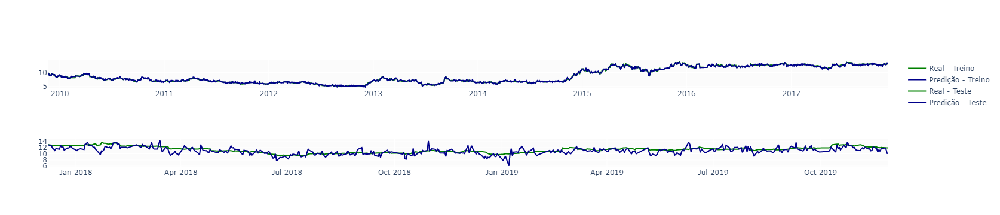



DataFrame consolidado de parâmetros e resultados tentados até aqui:


,learning_rate,n_estimators,max_depth,min_child_weight,gamma,colsample_bytree,reg_alpha,reg_lambda,MAPE_train,MAPE_test,MSE_train,MSE_test,MAE_train,MAE_test,RMSE_train,RMSE_test
0,0.1,806.0,5.0,1.0,0.0,0.8,0.00,1.0,0.001013,0.069134,0.011246,0.999326,0.008335,0.783562,0.000126,0.998652
1,0.1,1000.0,3.0,5.0,0.0,0.8,0.00,1.0,0.017518,0.066185,0.196062,0.953512,0.147014,0.751450,0.038440,0.909186
2,0.1,1000.0,3.0,5.0,0.0,0.9,0.01,1.0,0.017016,0.064864,0.183380,0.948480,0.140823,0.734908,0.033628,0.899615


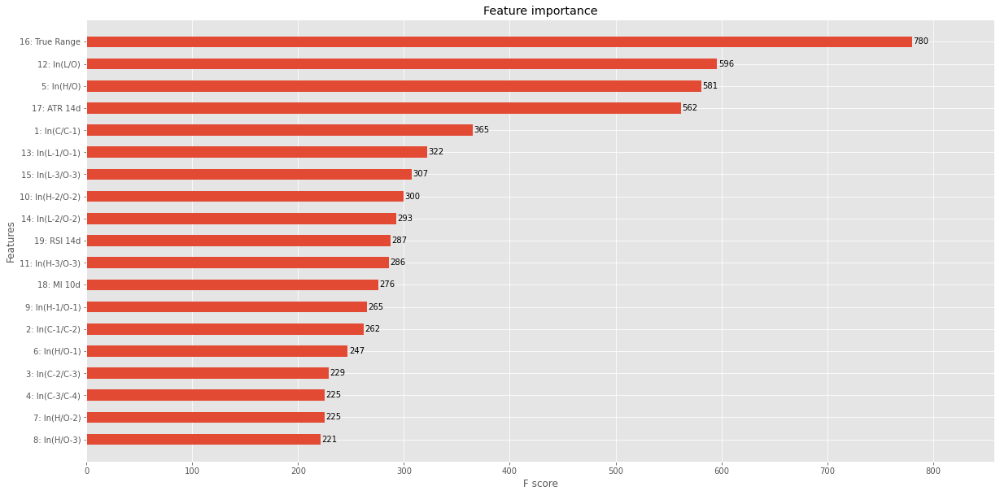

In [496]:
xgb3 = xgb.XGBRegressor(
         learning_rate =0.1,
         n_estimators=1000,
         max_depth=3,
         min_child_weight=5,
         gamma=0,
         colsample_bytree=0.9,
         subsample = 0.6,
         reg_alpha = 0.01,
         objective= 'reg:squarederror',
         nthread=6,
         seed=248)

model_fit(estimator = xgb3, dtrain = list(dict_train.values())[0], dtest = list(dict_test.values())[0], features = list(dict_X_train.values())[0].columns, target = 'Close', dmodel = df_model, cv_folds=10, early_stopping_rounds=50)

## Step 6: Reducing Learning Rate
Lastly, we should lower the learning rate and add more trees. Let's use the cv function of XGBoost to do the job again.

[0]	train-rmse:8.64973+0.01879	test-rmse:8.64822+0.17129
[1]	train-rmse:8.56956+0.01855	test-rmse:8.56817+0.17112
[2]	train-rmse:8.49032+0.01838	test-rmse:8.48914+0.17077
[3]	train-rmse:8.41194+0.01832	test-rmse:8.41099+0.17008
[4]	train-rmse:8.33452+0.01820	test-rmse:8.33383+0.16956
[5]	train-rmse:8.25767+0.01812	test-rmse:8.25751+0.16965
[6]	train-rmse:8.18189+0.01774	test-rmse:8.18215+0.16963
[7]	train-rmse:8.10682+0.01728	test-rmse:8.10735+0.16992
[8]	train-rmse:8.03240+0.01729	test-rmse:8.03301+0.16972
[9]	train-rmse:7.95880+0.01699	test-rmse:7.95981+0.16978
[10]	train-rmse:7.88610+0.01684	test-rmse:7.88729+0.16956
[11]	train-rmse:7.81405+0.01663	test-rmse:7.81554+0.16953
[12]	train-rmse:7.74271+0.01642	test-rmse:7.74460+0.16926
[13]	train-rmse:7.67222+0.01615	test-rmse:7.67445+0.16908
[14]	train-rmse:7.60243+0.01598	test-rmse:7.60479+0.16881
[15]	train-rmse:7.53352+0.01579	test-rmse:7.53618+0.16863
[16]	train-rmse:7.46515+0.01592	test-rmse:7.46770+0.16824
[17]	train-rmse:7.39738+

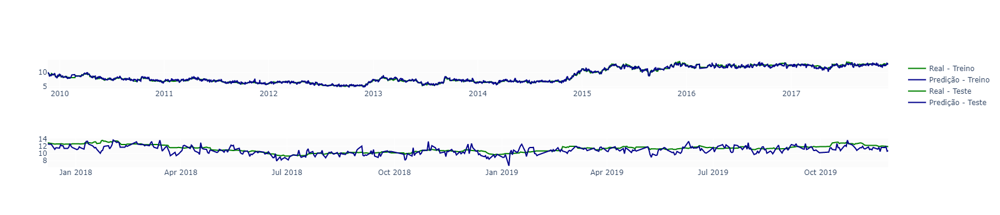



DataFrame consolidado de parâmetros e resultados tentados até aqui:


,learning_rate,n_estimators,max_depth,min_child_weight,gamma,colsample_bytree,reg_alpha,reg_lambda,MAPE_train,MAPE_test,MSE_train,MSE_test,MAE_train,MAE_test,RMSE_train,RMSE_test
0,0.10,806.0,5.0,1.0,0.0,0.8,0.00,1.0,0.001013,0.069134,0.011246,0.999326,0.008335,0.783562,0.000126,0.998652
1,0.10,1000.0,3.0,5.0,0.0,0.8,0.00,1.0,0.017518,0.066185,0.196062,0.953512,0.147014,0.751450,0.038440,0.909186
2,0.10,1000.0,3.0,5.0,0.0,0.9,0.01,1.0,0.017016,0.064864,0.183380,0.948480,0.140823,0.734908,0.033628,0.899615
3,0.01,5000.0,3.0,5.0,0.0,0.9,0.01,1.0,0.031431,0.063064,0.343477,0.914009,0.265070,0.716799,0.117976,0.835413


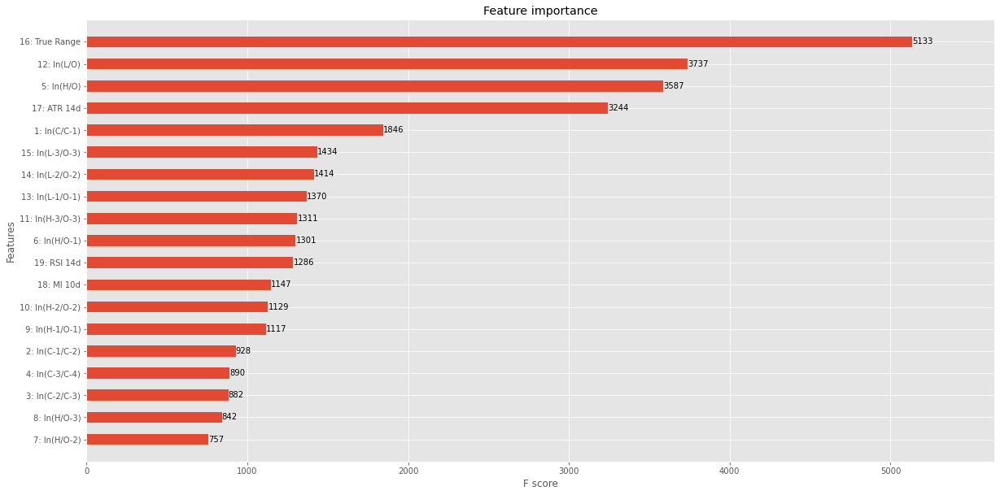

In [497]:
xgb4 = xgb.XGBRegressor(
         learning_rate =0.01,
         n_estimators=5000,
         max_depth=3,
         min_child_weight=5,
         gamma=0,
         colsample_bytree=0.9,
         subsample = 0.6,
         reg_alpha = 0.01,
         objective= 'reg:squarederror',
         nthread=6,
         seed=248)

model_fit(estimator = xgb4, dtrain = list(dict_train.values())[0], dtest = list(dict_test.values())[0], features = list(dict_X_train.values())[0].columns, target = 'Close', dmodel = df_model, cv_folds=10, early_stopping_rounds=50)

## Step 7: Explorar o reg_lambda:

In [498]:
param_test8 = {
 'reg_lambda':[0, 1e-5, 1e-2, 0.1, 1, 100]
}
gsearch8 = GridSearchCV(estimator = xgb.XGBRegressor( learning_rate =0.1, n_estimators=1000, max_depth=3,
                         min_child_weight=5, gamma=0, subsample=0.6, colsample_bytree=0.9, reg_alpha = 0.01,
                         objective= 'reg:squarederror', seed=248), 
                         param_grid = param_test8, n_jobs= -1, cv=5, verbose=2)

gsearch8.fit(list(dict_X_train.values())[0], list(dict_y_train.values())[0])
gsearch8.cv_results_['params'], gsearch8.best_params_, gsearch8.best_score_

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   14.5s finished


([{'reg_lambda': 0},
  {'reg_lambda': 1e-05},
  {'reg_lambda': 0.01},
  {'reg_lambda': 0.1},
  {'reg_lambda': 1},
  {'reg_lambda': 100}],
 {'reg_lambda': 1},
 -18.32881146616007)

Não mudou muita coisa... O valor default (lambda = 1) é o melhor valor até então. Vamos aumentar um pouco mais a granularidade em torno de 1, para verificar:

In [499]:
param_test9 = {
 'reg_lambda':[0.5, 0.75, 1, 1.25, 1.5, 1.75, 2]
}
gsearch9 = GridSearchCV(estimator = xgb.XGBRegressor( learning_rate =0.1, n_estimators=1000, max_depth=3,
                         min_child_weight=5, gamma=0, subsample=0.6, colsample_bytree=0.9, reg_alpha = 0.01,
                         objective= 'reg:squarederror', seed=248), 
                         param_grid = param_test9, n_jobs= -1, cv=5, verbose=2)

gsearch9.fit(list(dict_X_train.values())[0], list(dict_y_train.values())[0])
gsearch9.cv_results_['params'], gsearch9.best_params_, gsearch9.best_score_

Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:   15.6s finished


([{'reg_lambda': 0.5},
  {'reg_lambda': 0.75},
  {'reg_lambda': 1},
  {'reg_lambda': 1.25},
  {'reg_lambda': 1.5},
  {'reg_lambda': 1.75},
  {'reg_lambda': 2}],
 {'reg_lambda': 1},
 -18.32881146616007)

Continua 1 como melhor valor. Aprofundando ainda mais o range:

In [500]:
param_test10 = {
 'reg_lambda':[0.85, 0.95, 1, 1.05, 1.15, 1.25]
}
gsearch10 = GridSearchCV(estimator = xgb.XGBRegressor( learning_rate =0.1, n_estimators=1000, max_depth=3,
                         min_child_weight=5, gamma=0, subsample=0.6, colsample_bytree=0.9, reg_alpha = 0.01,
                         objective= 'reg:squarederror', seed=248), 
                         param_grid = param_test10, n_jobs= -1, cv=5, verbose=2)

gsearch10.fit(list(dict_X_train.values())[0], list(dict_y_train.values())[0])
gsearch10.cv_results_['params'], gsearch10.best_params_, gsearch10.best_score_

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   14.3s finished


([{'reg_lambda': 0.85},
  {'reg_lambda': 0.95},
  {'reg_lambda': 1},
  {'reg_lambda': 1.05},
  {'reg_lambda': 1.15},
  {'reg_lambda': 1.25}],
 {'reg_lambda': 1},
 -18.32881146616007)

Não tem jeito... reg_lambda é 1 mesmo. Vamos acrescentar esse parâmetro ao modelo (embora já seja o default, então não vai mudar nada...) e dar um último fit:

[0]	train-rmse:8.64973+0.01879	test-rmse:8.64822+0.17129
[1]	train-rmse:8.56956+0.01855	test-rmse:8.56817+0.17112
[2]	train-rmse:8.49032+0.01838	test-rmse:8.48914+0.17077
[3]	train-rmse:8.41194+0.01832	test-rmse:8.41099+0.17008
[4]	train-rmse:8.33452+0.01820	test-rmse:8.33383+0.16956
[5]	train-rmse:8.25767+0.01812	test-rmse:8.25751+0.16965
[6]	train-rmse:8.18189+0.01774	test-rmse:8.18215+0.16963
[7]	train-rmse:8.10682+0.01728	test-rmse:8.10735+0.16992
[8]	train-rmse:8.03240+0.01729	test-rmse:8.03301+0.16972
[9]	train-rmse:7.95880+0.01699	test-rmse:7.95981+0.16978
[10]	train-rmse:7.88610+0.01684	test-rmse:7.88729+0.16956
[11]	train-rmse:7.81405+0.01663	test-rmse:7.81554+0.16953
[12]	train-rmse:7.74271+0.01642	test-rmse:7.74460+0.16926
[13]	train-rmse:7.67222+0.01615	test-rmse:7.67445+0.16908
[14]	train-rmse:7.60243+0.01598	test-rmse:7.60479+0.16881
[15]	train-rmse:7.53352+0.01579	test-rmse:7.53618+0.16863
[16]	train-rmse:7.46515+0.01592	test-rmse:7.46770+0.16824
[17]	train-rmse:7.39738+

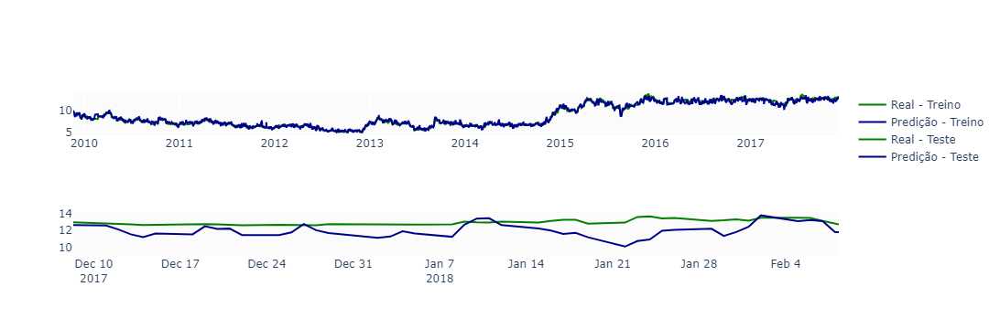



DataFrame consolidado de parâmetros e resultados tentados até aqui:


,learning_rate,n_estimators,max_depth,min_child_weight,gamma,colsample_bytree,reg_alpha,reg_lambda,MAPE_train,MAPE_test,MSE_train,MSE_test,MAE_train,MAE_test,RMSE_train,RMSE_test
0,0.10,806.0,5.0,1.0,0.0,0.8,0.00,1.0,0.001013,0.069134,0.011246,0.999326,0.008335,0.783562,0.000126,0.998652
1,0.10,1000.0,3.0,5.0,0.0,0.8,0.00,1.0,0.017518,0.066185,0.196062,0.953512,0.147014,0.751450,0.038440,0.909186
2,0.10,1000.0,3.0,5.0,0.0,0.9,0.01,1.0,0.017016,0.064864,0.183380,0.948480,0.140823,0.734908,0.033628,0.899615
3,0.01,5000.0,3.0,5.0,0.0,0.9,0.01,1.0,0.031431,0.063064,0.343477,0.914009,0.265070,0.716799,0.117976,0.835413
4,0.01,5000.0,3.0,5.0,0.0,0.9,0.01,1.0,0.031431,0.063064,0.343477,0.914009,0.265070,0.716799,0.117976,0.835413


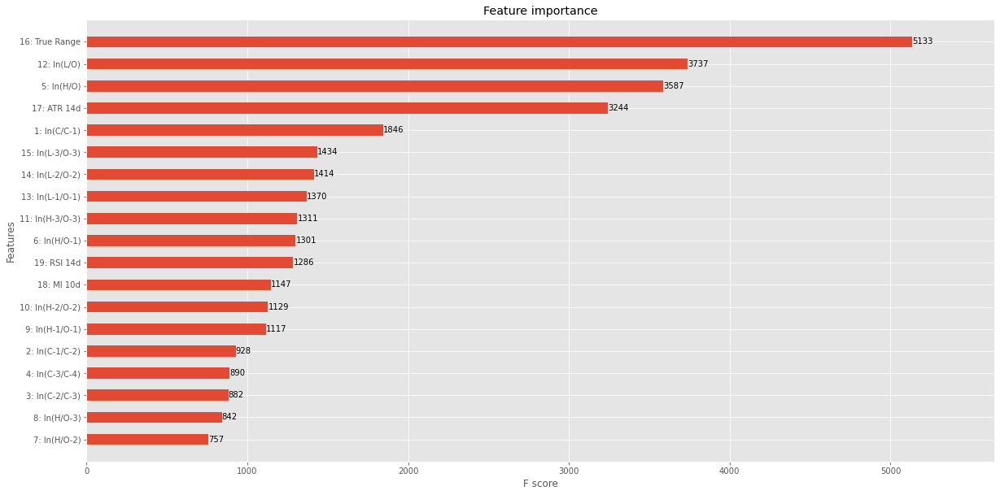

In [501]:
xgb5 = xgb.XGBRegressor(
         learning_rate =0.01,
         n_estimators=5000,
         max_depth=3,
         min_child_weight=5,
         gamma=0,
         colsample_bytree=0.9,
         subsample = 0.6,
         reg_alpha = 0.01,
         reg_lambda = 1,
         objective= 'reg:squarederror',
         nthread=6,
         seed=248)

model_fit(estimator = xgb5, dtrain = list(dict_train.values())[0], dtest = list(dict_test.values())[0], features = list(dict_X_train.values())[0].columns, target = 'Close', dmodel = df_model, cv_folds=10, early_stopping_rounds=50)